In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv("https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv")
pd.set_option('display.max_columns',None)
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


# Exploratory Data Analysis

In [3]:
df.shape

(8425, 23)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [5]:
df.columns.to_list()

['Date',
 'Location',
 'MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustDir',
 'WindGustSpeed',
 'WindDir9am',
 'WindDir3pm',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'RainToday',
 'RainTomorrow']

Let's convert the dtype of Data to datetime

In [6]:
df['Date'] = pd.to_datetime(df['Date'])

In [7]:
df.dtypes

Date             datetime64[ns]
Location                 object
MinTemp                 float64
MaxTemp                 float64
Rainfall                float64
Evaporation             float64
Sunshine                float64
WindGustDir              object
WindGustSpeed           float64
WindDir9am               object
WindDir3pm               object
WindSpeed9am            float64
WindSpeed3pm            float64
Humidity9am             float64
Humidity3pm             float64
Pressure9am             float64
Pressure3pm             float64
Cloud9am                float64
Cloud3pm                float64
Temp9am                 float64
Temp3pm                 float64
RainToday                object
RainTomorrow             object
dtype: object

In [8]:
#Extracting Day from Date_of_journey column
df['Day'] = pd.to_datetime(df.Date,format="%d/%m/%Y").dt.day

#Extracting Month from Date_of_journey column
df['Month'] = pd.to_datetime(df.Date, format="%d/%m/%Y").dt.month

#Extracting Year from Date_of_journey column
df['Year'] = pd.to_datetime(df.Date, format="%d/%m/%Y").dt.year


In [9]:
df.drop(columns=['Date'],axis=1,inplace=True)

In [10]:
df.columns.to_list()

['Location',
 'MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustDir',
 'WindGustSpeed',
 'WindDir9am',
 'WindDir3pm',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'RainToday',
 'RainTomorrow',
 'Day',
 'Month',
 'Year']

In [11]:
df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,2,12,2008
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,3,12,2008
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,4,12,2008
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,5,12,2008


In [12]:
df.shape

(8425, 25)

In [13]:
for i in df.columns:
    print(df[i].value_counts())
    print("\n")

Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64


 12.0    74
 13.2    71
 13.8    69
 12.7    68
 14.8    67
         ..
-1.4      1
 26.6     1
 26.9     1
 0.3      1
-1.1      1
Name: MinTemp, Length: 285, dtype: int64


19.0    87
23.8    75
19.8    74
25.0    71
22.0    68
        ..
39.5     1
10.4     1
9.4      1
40.6     1
43.5     1
Name: MaxTemp, Length: 331, dtype: int64


0.0     5299
0.2      406
0.4      177
0.6      116
1.2       86
        ... 
59.0       1
29.2       1
58.0       1
51.0       1
99.2       1
Name: Rainfall, Length: 250, dtype: int64


4.0     180
3.0     163
2.4     147
2.2     146
2.6     143
       ... 
0.7       1
15.6      1
19.2      1
15.0      1
22.4      1
Name: Evaporation, Length: 116, dtype: int64


0.0     166


# Missing Values

In [14]:
df.isnull().sum()

Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
Day                 0
Month               0
Year                0
dtype: int64

In [15]:
#Filling null values in MinTemp with it's mean
df['MinTemp'] = df['MinTemp'].fillna(df['MinTemp'].mean())

#Filling null values in MaxTemp with it's mean
df['MaxTemp'] = df['MaxTemp'].fillna(df['MaxTemp'].mean())

#Fillinf null values in Rainfall with it's mode, as most of the rows have 0 rainfall.
df['Rainfall'] = df['Rainfall'].fillna(df['Rainfall'].mode()[0])

#Filling null values in Evaporation with it's mean
df['Evaporation'] = df['Evaporation'].fillna(df['Evaporation'].mean())

#Filling null values in Sunshine with it's mean
df['Sunshine'] = df['Sunshine'].fillna(df['Sunshine'].mean())

#Filling null values in WindGustDir with it's mode
df['WindGustDir'] = df['WindGustDir'].fillna(df['WindGustDir'].mode()[0])

#Filling null values in WindGustSpeed with it's mean
df['WindGustSpeed'] = df['WindGustSpeed'].fillna(df['WindGustSpeed'].mean())

#Filling null values in WindDir9am with it's mode
df['WindDir9am'] = df['WindDir9am'].fillna(df['WindDir9am'].mode()[0])

#Filling null values in WindDir3pm with it's mode
df['WindDir3pm'] = df['WindDir3pm'].fillna(df['WindDir3pm'].mode()[0])

#Filling null values in WindSpeed9am with it's mean
df['WindSpeed9am'] = df['WindSpeed9am'].fillna(df['WindSpeed9am'].mean())

#Filling null values in WindSpeed3pm with it's mean
df['WindSpeed3pm'] = df['WindSpeed3pm'].fillna(df['WindSpeed3pm'].mean())

#Filling null values in Humidity9am with it's mean
df['Humidity9am'] = df['Humidity9am'].fillna(df['Humidity9am'].mean())

#Filling null values in Humidity3pm with it's mean
df['Humidity3pm'] = df['Humidity3pm'].fillna(df['Humidity3pm'].mean())

#Filling null values in Pressure9am with it's mean
df['Pressure9am'] = df['Pressure9am'].fillna(df['Pressure9am'].mean())

#Filling null values in Pressure3pm with it's mean
df['Pressure3pm'] = df['Pressure3pm'].fillna(df['Pressure3pm'].mean())

#Filling null values in Cloud9am with it's mean
df['Cloud9am'] = df['Cloud9am'].fillna(df['Cloud9am'].mean())

#Filling null values in Cloud3pm with it's mean
df['Cloud3pm'] = df['Cloud3pm'].fillna(df['Cloud3pm'].mean())

#Filling null values in Temp9am with it's mean
df['Temp9am'] = df['Temp9am'].fillna(df['Temp9am'].mean())

#Filling null values in Temp3pm with it's mean
df['Temp3pm'] = df['Temp3pm'].fillna(df['Temp3pm'].mean())

#Filling null values in Temp3pm with it's mean
df['Temp3pm'] = df['Temp3pm'].fillna(df['Temp3pm'].mean())

#Filling null values in RainToday with it's mode
df['RainToday'] = df['RainToday'].fillna(df['RainToday'].mode()[0])

#Filling null values in RainTomorrow with it's mode
df['RainTomorrow'] = df['RainTomorrow'].fillna(df['RainTomorrow'].mode()[0])

In [16]:
df.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Day              0
Month            0
Year             0
dtype: int64

We have filled all the null values.

In [17]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,13.193305,23.859976,2.725982,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934,15.741958,6.442136,2012.102433
std,5.379488,6.114516,10.319872,3.852004,2.825451,13.776101,10.128579,9.704759,16.774231,18.311894,6.275759,6.217451,2.429205,2.299419,5.608301,5.945849,8.787354,3.437994,2.473137
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,1.000000,1.000000,2008.000000
25%,9.300000,19.300000,0.000000,4.000000,7.632205,31.000000,6.000000,11.000000,56.000000,39.000000,1014.000000,1011.400000,3.000000,3.000000,13.800000,18.100000,8.000000,3.000000,2010.000000
50%,13.200000,23.300000,0.000000,5.389395,7.632205,40.174469,13.000000,19.000000,68.000000,51.000000,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.000000,16.000000,6.000000,2011.000000
75%,17.300000,28.000000,0.800000,5.389395,8.900000,48.000000,20.000000,24.000000,80.000000,63.000000,1021.300000,1018.800000,7.000000,7.000000,21.900000,26.300000,23.000000,9.000000,2014.000000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,31.000000,12.000000,2017.000000


In [18]:
categorical_col = []
for i in df.dtypes.index:
    if df.dtypes[i]=="object":
        categorical_col.append(i)
print("Categorical Columns: ",categorical_col)
print("\n")

#Checking for Numerical columns
numerical_col = []
for i in df.dtypes.index:
    if df.dtypes[i]!="object":
        numerical_col.append(i)
print("Numerical Columns: ",numerical_col)

Categorical Columns:  ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


Numerical Columns:  ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'Day', 'Month', 'Year']


In [19]:
df['RainTomorrow'].value_counts()

No     6434
Yes    1991
Name: RainTomorrow, dtype: int64

# Univariate Analysis

No     6434
Yes    1991
Name: RainTomorrow, dtype: int64


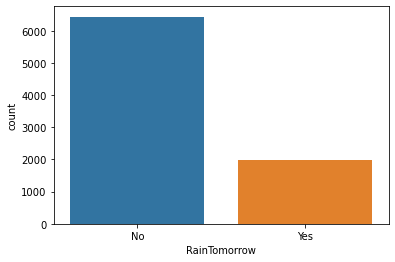

In [20]:
print(df['RainTomorrow'].value_counts())
sns.countplot(df['RainTomorrow'])
plt.show()

As we can see the count of No rainfall tomorrow is higher than there will be rainfall tomorrow, we shall handle this later using Oversampling.

Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64


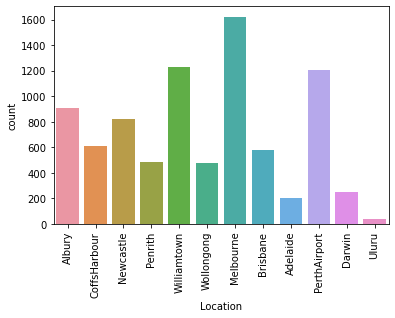

In [21]:
print(df['Location'].value_counts())
sns.countplot(df['Location'])
plt.xticks(rotation=90)
plt.show()

As we can observe from the above graph that, most of the data is from the location - Melbourne followed by the  location Williamtown, PerthAirport. The least data is from the location Uluru.

No     6435
Yes    1990
Name: RainToday, dtype: int64


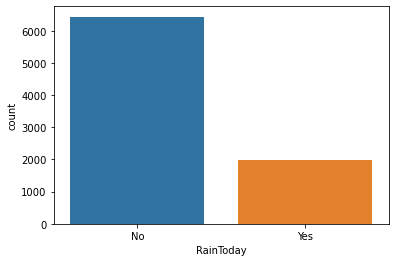

In [22]:
print(df['RainToday'].value_counts())
sns.countplot(df['RainToday'])
plt.show()

As we can observe from the above graph, the count of No rain today is higher than it will rain today.

N      1735
SW      704
NW      625
WSW     543
SE      505
WNW     480
SSW     467
ENE     433
NNE     430
W       414
NE      409
S       402
E       380
SSE     365
NNW     280
ESE     253
Name: WindDir9am, dtype: int64


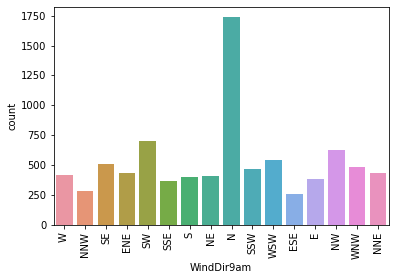

In [23]:
print(df['WindDir9am'].value_counts())
sns.countplot(df['WindDir9am'])
plt.xticks(rotation=90)
plt.show()

From the above graph we can see that at 9am in the morning, the wind direction is mainly towards the North and least towards ESE(East - South East)

SE     1121
S       742
SSE     623
WSW     580
NE      544
N       524
SW      494
WNW     487
NW      468
ESE     462
W       462
E       460
ENE     417
SSW     370
NNE     365
NNW     306
Name: WindDir3pm, dtype: int64


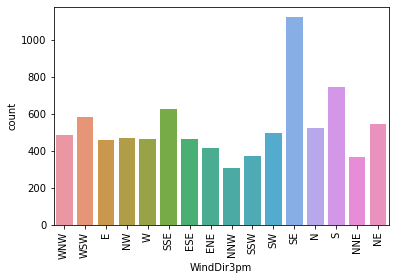

In [24]:
print(df['WindDir3pm'].value_counts())
sns.countplot(df['WindDir3pm'])
plt.xticks(rotation=90)
plt.show()

We can see that most of the time the direction of the wind at 3pm in the afternoon is towards SE(South East) and least towards the NNW(North - North West)

N      1704
SSE     578
S       577
SW      572
E       557
WNW     531
W       507
WSW     504
SE      484
ENE     415
SSW     396
NW      383
NE      353
NNE     343
ESE     302
NNW     219
Name: WindGustDir, dtype: int64


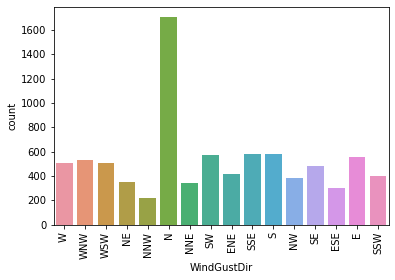

In [25]:
print(df['WindGustDir'].value_counts())
sns.countplot(df['WindGustDir'])
plt.xticks(rotation=90)
plt.show()

As we can see the WindGust Direction is mostly towards the North direction and the least towards NNW(North - North West)

40.174469     991
39.000000     441
35.000000     435
37.000000     422
33.000000     408
31.000000     396
41.000000     371
30.000000     367
28.000000     332
43.000000     302
48.000000     292
26.000000     275
50.000000     259
46.000000     258
24.000000     255
52.000000     249
44.000000     241
22.000000     223
54.000000     210
20.000000     186
56.000000     153
57.000000     148
19.000000     137
61.000000     114
59.000000     113
63.000000      95
17.000000      92
65.000000      74
67.000000      64
72.000000      62
15.000000      58
13.000000      57
74.000000      54
70.000000      53
69.000000      49
76.000000      44
78.000000      23
80.000000      22
11.000000      18
85.000000      14
81.000000      13
91.000000      12
89.000000       7
93.000000       7
9.000000        6
83.000000       6
98.000000       4
94.000000       3
87.000000       3
7.000000        2
100.000000      2
102.000000      2
107.000000      1
Name: WindGustSpeed, dtype: int64


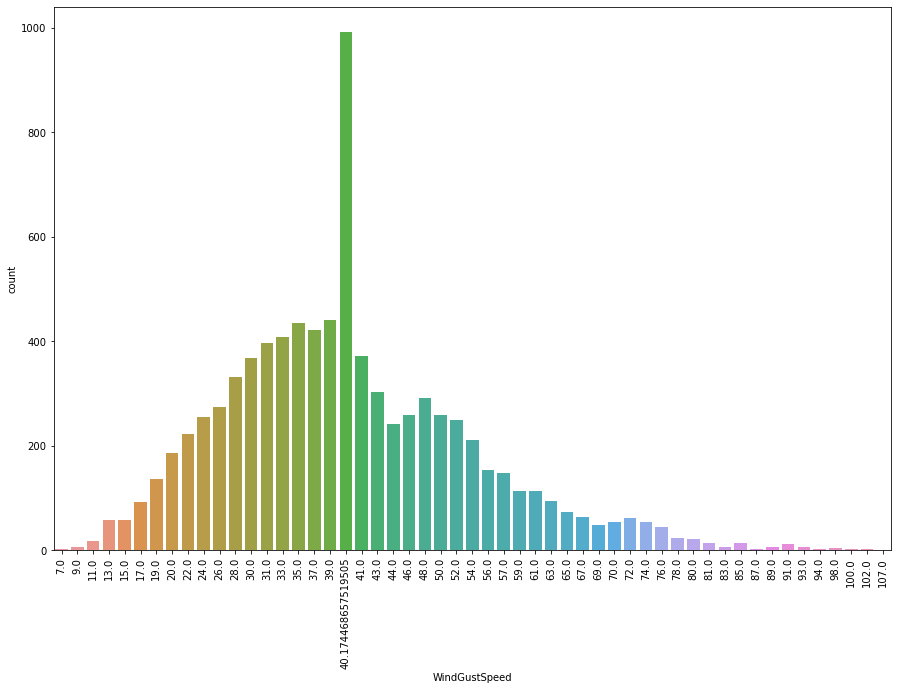

In [26]:
plt.figure(figsize=(15,10))
print(df['WindGustSpeed'].value_counts())
sns.countplot(df['WindGustSpeed'])
plt.xticks(rotation=90)
plt.show()

We cansee that the highest count of WindGust Speed is 40. and lowest count is of speed 107.

73.0    205
62.0    202
68.0    199
74.0    195
70.0    188
       ... 
16.0      2
11.0      2
17.0      2
15.0      1
10.0      1
Name: Humidity9am, Length: 91, dtype: int64


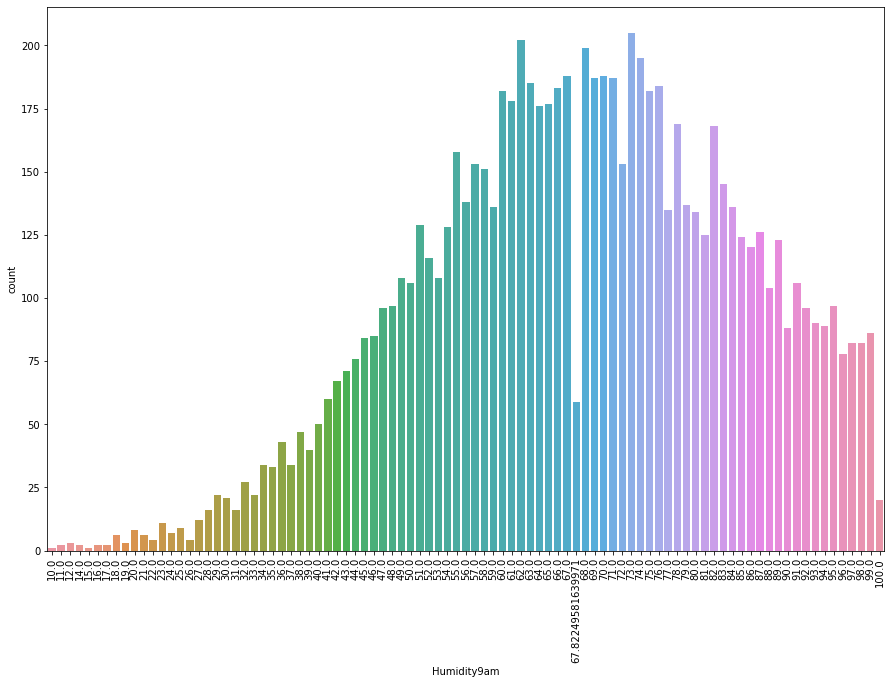

In [27]:
plt.figure(figsize=(15,10))
print(df['Humidity9am'].value_counts())
sns.countplot(df['Humidity9am'])
plt.xticks(rotation=90)
plt.show()

As we can see, the count of the humidity 67 is the highest and the count of humidity level 10 is the least.

4.566622    2421
7.000000    1418
1.000000    1038
8.000000    1015
0.000000     554
6.000000     551
5.000000     414
3.000000     384
2.000000     357
4.000000     273
Name: Cloud9am, dtype: int64


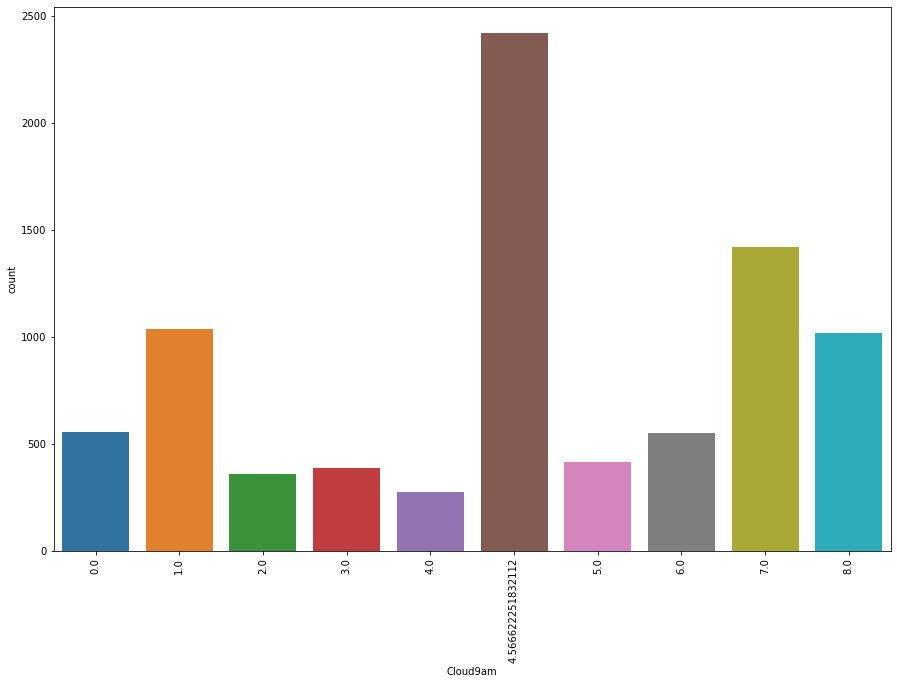

In [28]:
plt.figure(figsize=(15,10))
print(df['Cloud9am'].value_counts())
sns.countplot(df['Cloud9am'])
plt.xticks(rotation=90)
plt.show()

As we can see the maximum count of the fraction of sky obscured by cloud at 9am is 4.56 and least count of the fraction of sky obscured by cloud at 9am is 4.0

4.503183    2455
7.000000    1294
1.000000    1077
8.000000     863
6.000000     597
5.000000     522
2.000000     508
3.000000     411
4.000000     351
0.000000     347
Name: Cloud3pm, dtype: int64


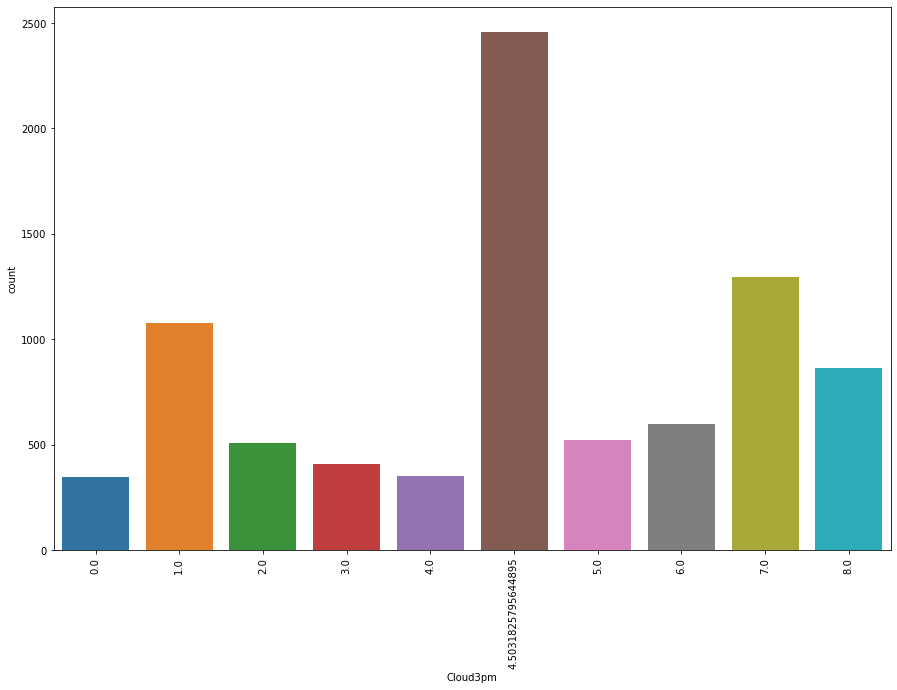

In [29]:
plt.figure(figsize=(15,10))
print(df['Cloud3pm'].value_counts())
sns.countplot(df['Cloud3pm'])
plt.xticks(rotation=90)
plt.show()

As we can see the maximum count of the fraction of sky obscured by cloud at 3pm is 4.50 and least count of the fraction of sky obscured by cloud at 9am is 0

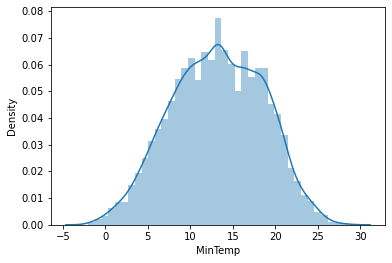

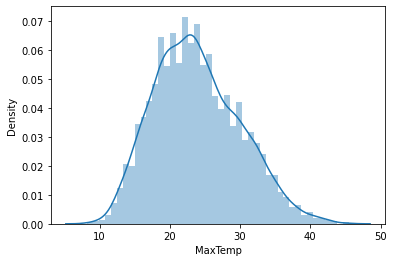

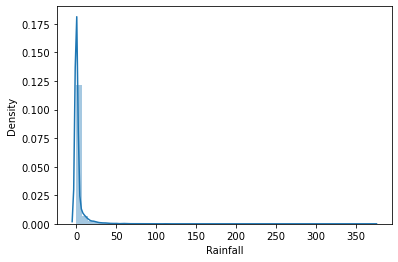

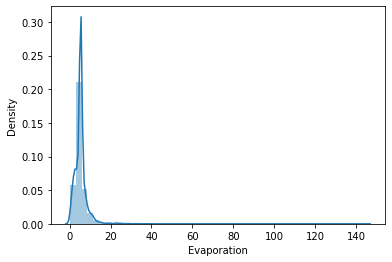

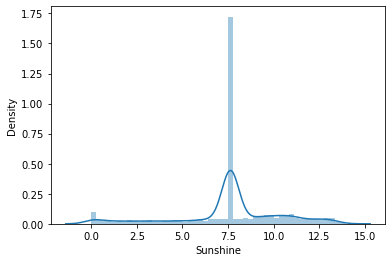

...

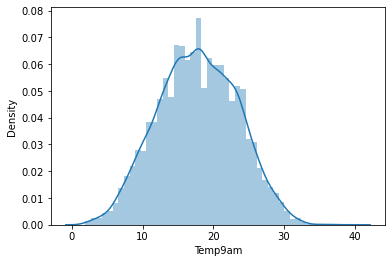

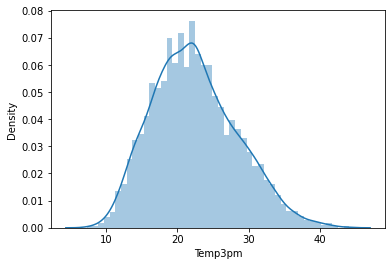

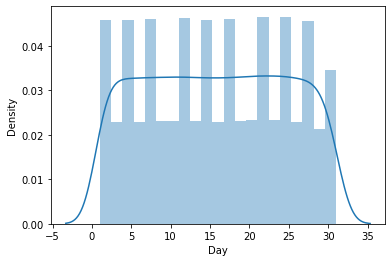

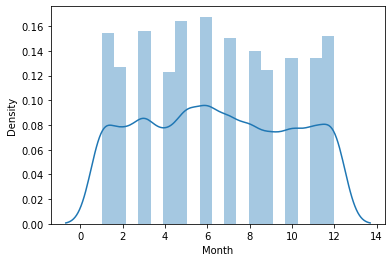

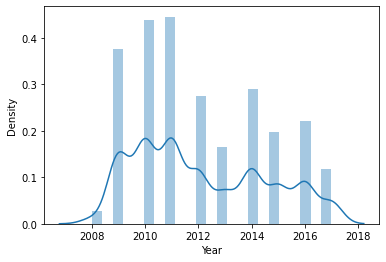

In [30]:
for i in numerical_col:
    sns.distplot(df[i])
    plt.show()

#### Let us label encode the target 

In [31]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df['RainTomorrow'] = le.fit_transform(df['RainTomorrow'])
df['RainTomorrow'].value_counts()

0    6434
1    1991
Name: RainTomorrow, dtype: int64

# Bivariate Analysis

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, 'Albury'),
  Text(1, 0, 'CoffsHarbour'),
  Text(2, 0, 'Newcastle'),
  Text(3, 0, 'Penrith'),
  Text(4, 0, 'Williamtown'),
  Text(5, 0, 'Wollongong'),
  Text(6, 0, 'Melbourne'),
  Text(7, 0, 'Brisbane'),
  Text(8, 0, 'Adelaide'),
  Text(9, 0, 'PerthAirport'),
  Text(10, 0, 'Darwin'),
  Text(11, 0, 'Uluru')])

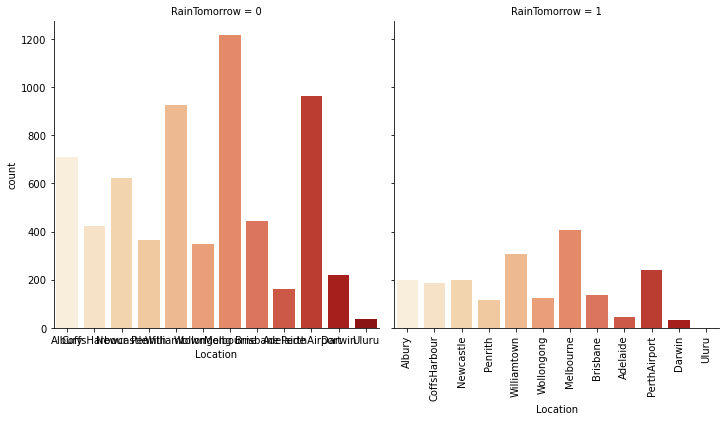

In [32]:
sns.catplot(x='Location',col='RainTomorrow',palette="OrRd",kind="count",data=df)
plt.xticks(rotation=90)

From the above graph we see that
1. The count of no rainfall tomorrow in the location Brisbane is the highest followed by the location PerthAirport
2. The count of Yes rainfall(there will be rainfall tomorrow) is the highest in the location Melbourne followed by Williamtown.

<AxesSubplot:xlabel='MinTemp', ylabel='RainTomorrow'>

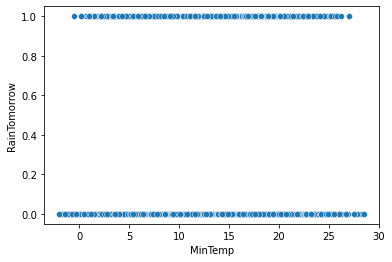

In [33]:
sns.scatterplot(x='MinTemp',y='RainTomorrow',palette="OrRd",data=df)

There is no relation between MinTemp and rainfall

<AxesSubplot:xlabel='MaxTemp', ylabel='RainTomorrow'>

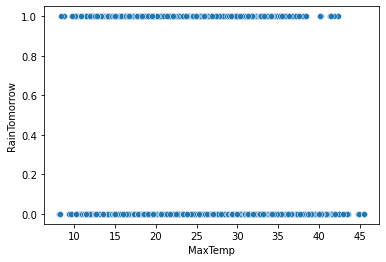

In [34]:
sns.scatterplot(x='MaxTemp',y='RainTomorrow',palette="OrRd",data=df)

There is no relation between MaxTemp and RainTomorow.

<AxesSubplot:xlabel='Evaporation', ylabel='RainTomorrow'>

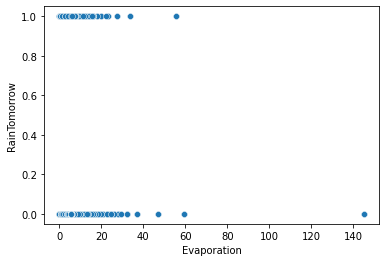

In [35]:
sns.scatterplot(x='Evaporation',y='RainTomorrow',palette="OrRd",data=df)

There is no relation between Evaporation and RainTomorrow

<AxesSubplot:xlabel='Sunshine', ylabel='RainTomorrow'>

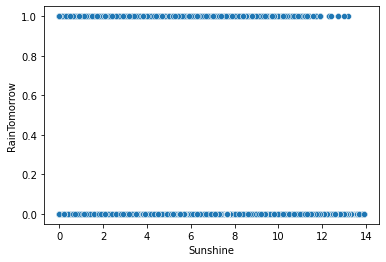

In [36]:
sns.scatterplot(x='Sunshine',y='RainTomorrow',palette="OrRd",data=df)

<AxesSubplot:xlabel='WindGustSpeed', ylabel='RainTomorrow'>

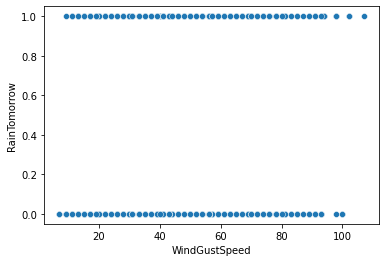

In [37]:
sns.scatterplot(x='WindGustSpeed',y='RainTomorrow',palette="OrRd",data=df)

<AxesSubplot:xlabel='Humidity9am', ylabel='RainTomorrow'>

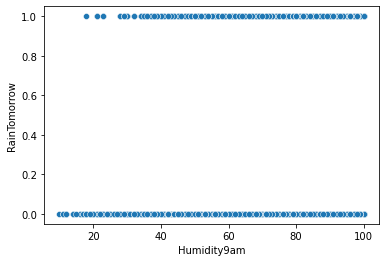

In [38]:
sns.scatterplot(x='Humidity9am',y='RainTomorrow',palette="OrRd",data=df)

<AxesSubplot:xlabel='Cloud9am', ylabel='RainTomorrow'>

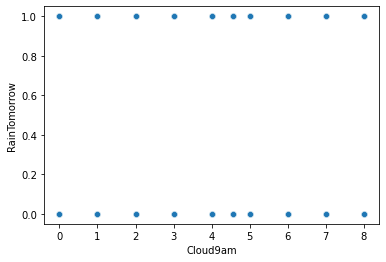

In [39]:
sns.scatterplot(x='Cloud9am',y='RainTomorrow',palette="OrRd",data=df)

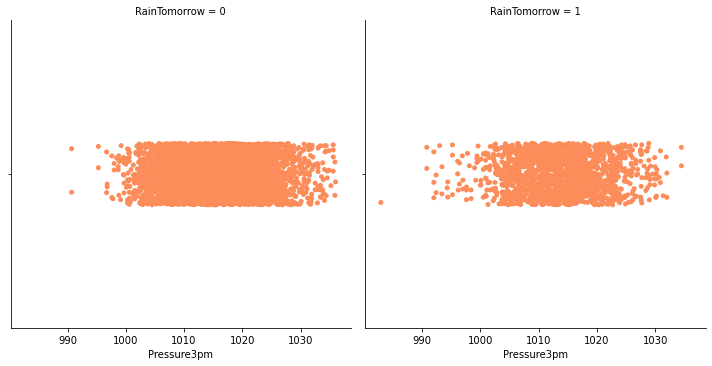

In [40]:
sns.catplot(x='Pressure3pm',col='RainTomorrow',palette="OrRd",data=df)

Not much relation between Pressure at 3pm and RainTomorrow

(array([-5.,  0.,  5., 10., 15., 20., 25., 30., 35.]),
 [Text(-5.0, 0, '−5'),
  Text(0.0, 0, '0'),
  Text(5.0, 0, '5'),
  Text(10.0, 0, '10'),
  Text(15.0, 0, '15'),
  Text(20.0, 0, '20'),
  Text(25.0, 0, '25'),
  Text(30.0, 0, '30'),
  Text(35.0, 0, '35')])

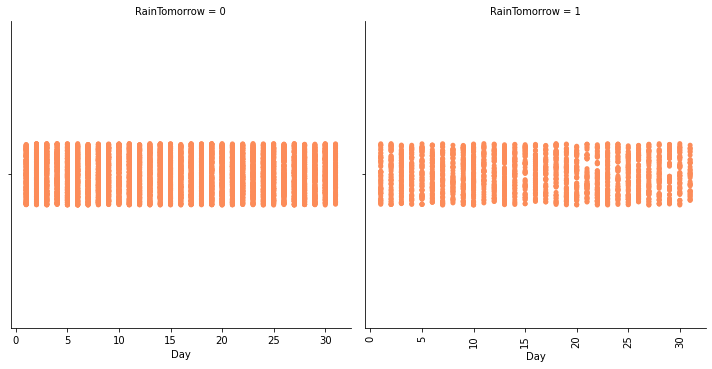

In [41]:
sns.catplot(x='Day',col='RainTomorrow',palette="OrRd",data=df)
plt.xticks(rotation=90)

# Multivariate Analysis

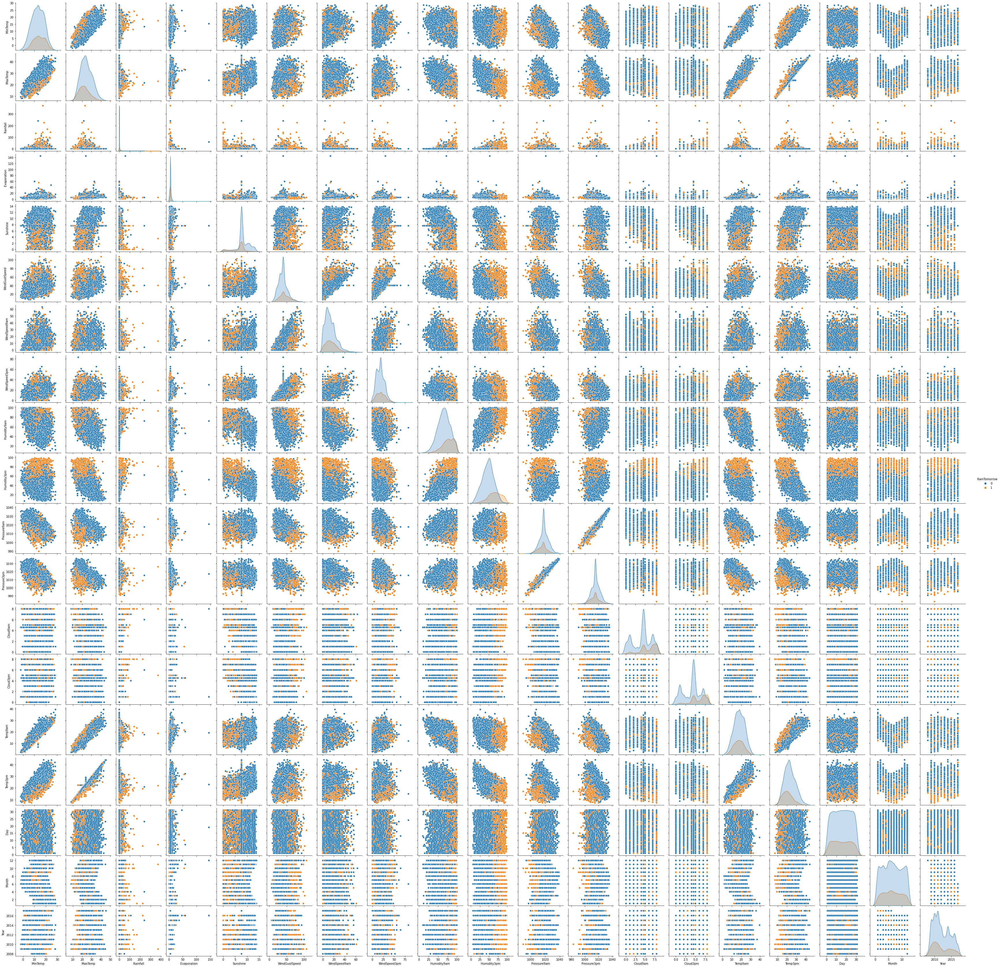

In [42]:
sns.pairplot(data=df,hue='RainTomorrow')

# Outliers

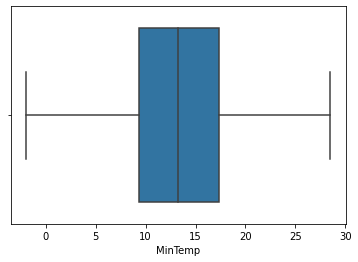

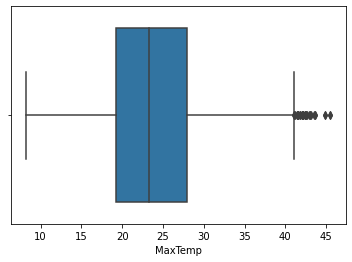

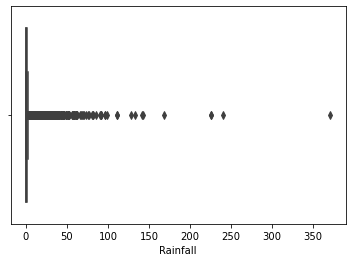

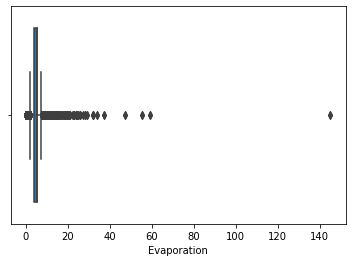

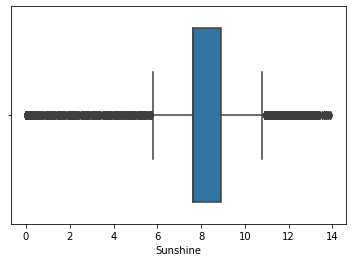

...

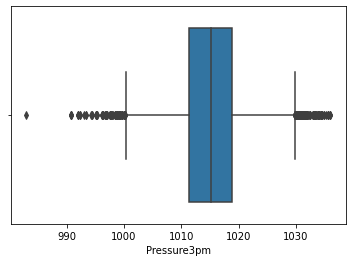

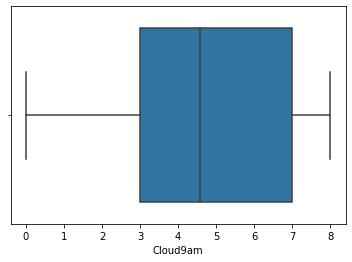

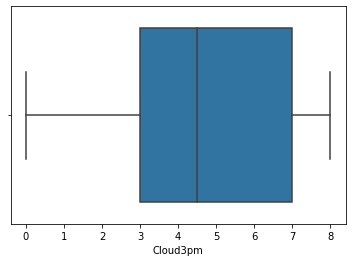

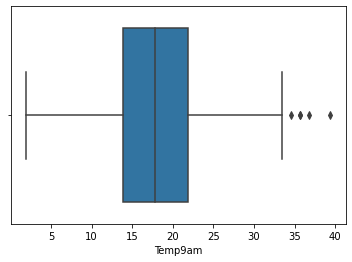

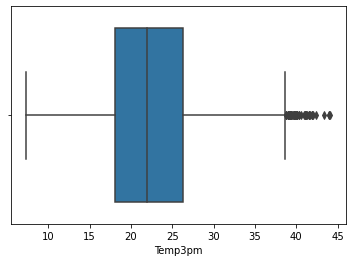

In [43]:
columns = ['MinTemp','MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm',
          'Humidity9am','Humidity3pm','Pressure9am','Pressure3pm','Cloud9am','Cloud3pm','Temp9am','Temp3pm']
for i in columns:
    sns.boxplot(df[i])
    plt.show()

From the above boxplots we can see that the following columns have outliers:
1. MaxTemp
2. Rainfall
3. Evaporation
4. Sunshine
5. WindGustSpeed
6. WindSpeed9am
7. WindSpeed3pm
8. Humidity9am
9. Pressure9am
10. Pressure3pm
11. Temp9am
12. Temp3pm

Let us remove the outliers using Zscore method.

In [44]:
from scipy.stats import zscore
col = df[['MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am',
         'Pressure9am','Pressure3pm','Temp9am','Temp3pm']]
z = np.abs(zscore(col))
z

array([[1.57008852e-01, 2.06020811e-01, 2.30589346e-16, ...,
        1.30866453e+00, 1.53712470e-01, 1.08138052e-01],
       [2.02812062e-01, 2.64164519e-01, 2.30589346e-16, ...,
        1.19607152e+00, 1.00217155e-01, 3.12348332e-01],
       [3.00945038e-01, 2.64164519e-01, 2.30589346e-16, ...,
        1.05130907e+00, 5.77390162e-01, 1.27334323e-01],
       ...,
       [4.97210991e-01, 2.64164519e-01, 2.30589346e-16, ...,
        2.51552929e-01, 9.38310416e-01, 6.15098528e-01],
       [5.13566487e-01, 2.64164519e-01, 2.30589346e-16, ...,
        2.03298781e-01, 4.74684357e-01, 5.98279073e-01],
       [2.90531973e-15, 2.64164519e-01, 2.30589346e-16, ...,
        4.28484806e-01, 4.92516128e-01, 2.59513150e-01]])

In [45]:
new_df = df[(z<3).all(axis=1)]
new_df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.9,0.6,5.389395,7.632205,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,0,1,12,2008
1,Albury,7.4,25.1,0.0,5.389395,7.632205,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,0,2,12,2008
2,Albury,12.9,25.7,0.0,5.389395,7.632205,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,0,3,12,2008
3,Albury,9.2,28.0,0.0,5.389395,7.632205,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,0,4,12,2008
4,Albury,17.5,32.3,1.0,5.389395,7.632205,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,0,5,12,2008


In [46]:
df.shape, new_df.shape

((8425, 25), (7987, 25))

In [47]:
data_loss = (8425-7987)/8425*100
data_loss

5.198813056379822

We have lost 5.19% (438) rows of data after removing the outliers using zscore method.

# Skewness

In [48]:
new_df.skew()

MinTemp         -0.084549
MaxTemp          0.314510
Rainfall         3.519090
Evaporation      0.846181
Sunshine        -0.723970
WindGustSpeed    0.506897
WindSpeed9am     0.711395
WindSpeed3pm     0.300109
Humidity9am     -0.231656
Humidity3pm      0.125150
Pressure9am      0.020735
Pressure3pm      0.044876
Cloud9am        -0.356892
Cloud3pm        -0.266829
Temp9am         -0.038035
Temp3pm          0.334170
RainTomorrow     1.296077
Day              0.002731
Month            0.054460
Year             0.430100
dtype: float64

There is skew in the following columns:
1. Rainfall
2. Evaporation
3. Sunshine
4. WindSpeed9am

Let us now remove the skew.

In [49]:
new_df['Rainfall'] = np.cbrt(new_df['Rainfall'])

In [50]:
new_df['Evaporation'] = np.sqrt(new_df['Evaporation'])

In [51]:
new_df['Sunshine'] = np.square(new_df['Sunshine'])

In [52]:
new_df['WindSpeed9am'] = np.sqrt(new_df['WindSpeed9am'])

In [53]:
new_df.skew()

MinTemp         -0.084549
MaxTemp          0.314510
Rainfall         1.473709
Evaporation     -0.410953
Sunshine         0.778560
WindGustSpeed    0.506897
WindSpeed9am    -0.517704
WindSpeed3pm     0.300109
Humidity9am     -0.231656
Humidity3pm      0.125150
Pressure9am      0.020735
Pressure3pm      0.044876
Cloud9am        -0.356892
Cloud3pm        -0.266829
Temp9am         -0.038035
Temp3pm          0.334170
RainTomorrow     1.296077
Day              0.002731
Month            0.054460
Year             0.430100
dtype: float64

We have now removed the skew.

In [54]:
new_df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.9,0.843433,2.321507,58.250552,W,44.0,W,WNW,4.472136,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,0,1,12,2008
1,Albury,7.4,25.1,0.000000,2.321507,58.250552,WNW,44.0,NNW,WSW,2.000000,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,0,2,12,2008
2,Albury,12.9,25.7,0.000000,2.321507,58.250552,WSW,46.0,W,WSW,4.358899,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,0,3,12,2008
3,Albury,9.2,28.0,0.000000,2.321507,58.250552,NE,24.0,SE,E,3.316625,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,0,4,12,2008
4,Albury,17.5,32.3,1.000000,2.321507,58.250552,W,41.0,ENE,NW,2.645751,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,0,5,12,2008


In [55]:
cat_cols = ['Location','WindGustDir','WindDir9am','WindDir3pm','RainToday']

In [56]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
new_df[cat_cols] = new_df[cat_cols].apply(le.fit_transform)
new_df[cat_cols].head()

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday
0,1,13,13,14,0
1,1,14,6,15,0
2,1,15,13,15,0
3,1,4,9,0,0
4,1,13,1,7,0


# Correlation

In [57]:
corr = new_df.corr()
corr

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
Location,1.000000,0.116694,0.063798,0.013245,0.128261,0.026124,-0.037707,0.245658,-0.041030,-0.031195,0.232326,0.231939,0.003725,0.059978,-0.024265,-0.012288,0.041859,0.027050,0.118100,0.060707,0.002934,0.009222,-0.004978,-0.086011,0.481143
MinTemp,0.116694,1.000000,0.718598,0.073519,0.366061,0.116202,-0.154935,0.231097,-0.045231,-0.154184,0.170246,0.185976,-0.126383,0.090208,-0.433113,-0.427936,0.089354,0.036649,0.888690,0.687570,0.061728,0.091021,0.010924,-0.247066,0.040001
MaxTemp,0.063798,0.718598,1.000000,-0.229296,0.468235,0.413505,-0.237955,0.136337,-0.217160,-0.190417,0.030426,0.093241,-0.382687,-0.409560,-0.333569,-0.414358,-0.252579,-0.248268,0.864864,0.974957,-0.219747,-0.149708,0.017068,-0.164351,0.120204
Rainfall,0.013245,0.073519,-0.229296,1.000000,-0.171300,-0.244249,0.124172,0.081775,0.155484,0.113229,0.025468,0.020535,0.400047,0.380798,-0.108021,-0.031431,0.295058,0.259063,-0.094134,-0.239093,0.903292,0.322561,-0.018118,-0.006507,0.007964
Evaporation,0.128261,0.366061,0.468235,-0.171300,1.000000,0.384244,-0.119515,0.173491,-0.104359,-0.039052,0.057377,0.082771,-0.307684,-0.223703,-0.259697,-0.275208,-0.108208,-0.142809,0.435477,0.455210,-0.168056,-0.089387,0.010554,-0.051104,0.141194
Sunshine,0.026124,0.116202,0.413505,-0.244249,0.384244,1.000000,-0.117915,0.044567,-0.087463,-0.074727,0.075173,0.085029,-0.416243,-0.429820,-0.024581,-0.086460,-0.548717,-0.555056,0.309941,0.426511,-0.220519,-0.301613,0.006048,0.004543,-0.019222
WindGustDir,-0.037707,-0.154935,-0.237955,0.124172,-0.119515,-0.117915,1.000000,0.005465,0.405681,0.507292,0.091798,0.108357,0.031081,0.051061,-0.095047,-0.008263,0.123415,0.093527,-0.185080,-0.249791,0.121709,0.044378,0.017003,0.038044,-0.096042
WindGustSpeed,0.245658,0.231097,0.136337,0.081775,0.173491,0.044567,0.005465,1.000000,-0.069460,0.076737,0.507947,0.628452,-0.263933,-0.085009,-0.377284,-0.336132,0.013678,0.064375,0.198936,0.101786,0.076677,0.181478,-0.005232,0.045638,-0.035546
WindDir9am,-0.041030,-0.045231,-0.217160,0.155484,-0.104359,-0.087463,0.405681,-0.069460,1.000000,0.243622,0.171452,0.058887,0.009571,0.117910,-0.003943,0.081400,0.092396,0.062637,-0.101576,-0.224390,0.149239,0.027091,-0.010014,0.018344,-0.034468
WindDir3pm,-0.031195,-0.154184,-0.190417,0.113229,-0.039052,-0.074727,0.507292,0.076737,0.243622,1.000000,0.036733,0.079716,-0.007820,-0.009385,-0.129842,-0.037280,0.073742,0.054321,-0.172000,-0.202000,0.100983,0.003674,-0.000714,0.028629,-0.010781


<AxesSubplot:>

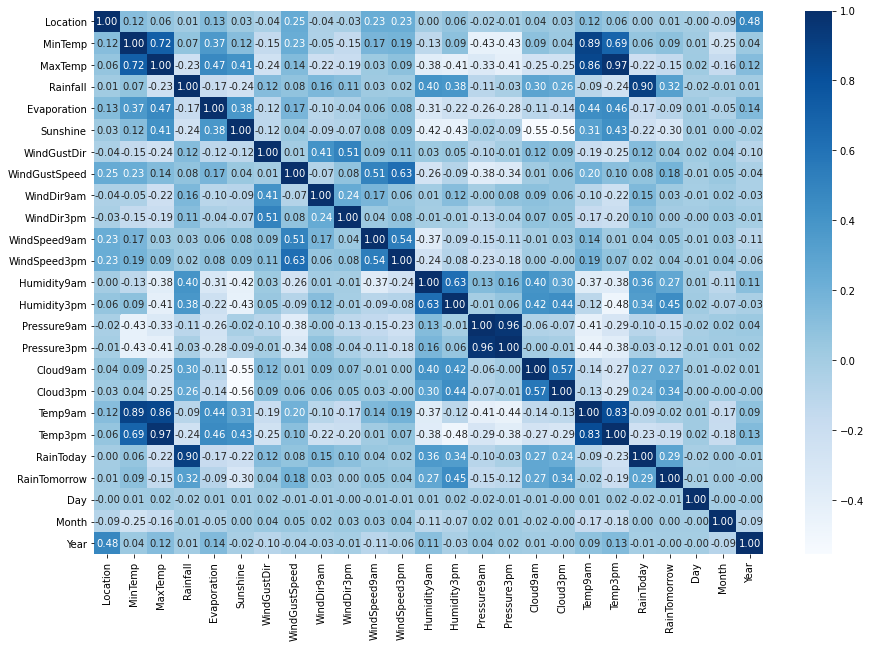

In [58]:
plt.figure(figsize=(15,10))
sns.heatmap(corr,fmt = '.2f', annot = True,cmap ='Blues')

From the above heatmap we can observe the following:
1. Humidity3pm has the highest positive correlation with the target RainTomorrow
2. Multicolinearity problem might arise, we will check it later using VIF
3. The features Location, WindGustDir, WindDir9am, WIndDir3pm, WindSpeed 9am, WindSpeed3pm, Temp9am has very less correlation with the target

In [59]:
x = new_df.drop('RainTomorrow',axis=1)
y = new_df['RainTomorrow']

In [60]:
x.shape, y.shape

((7987, 24), (7987,))

# Standard Scaler

In [61]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
x = pd.DataFrame(sc.fit_transform(x),columns=x.columns)

In [62]:
x.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Day,Month,Year
0,-1.508427,0.056444,-0.145732,0.432100,0.22369,-0.213669,1.229267,0.364103,1.250245,1.400214,0.761025,0.638072,0.184123,-1.624174,-1.687142,-1.398115,1.425345,0.013138,-0.138099,-0.098593,-0.542476,-1.671657,1.634113,-1.661315
1,-1.508427,-1.058476,0.220676,-0.614634,0.22369,-0.213669,1.441960,0.364103,-0.277857,1.626597,-0.859716,0.421555,-1.455097,-1.457752,-1.202435,-1.279988,0.011773,0.013138,-0.084254,0.329747,-0.542476,-1.557976,1.634113,-1.661315
2,-1.508427,-0.036466,0.320605,-0.614634,0.22369,-0.213669,1.654654,0.520531,1.250245,1.626597,0.686787,0.854590,-1.819368,-1.180382,-1.703856,-1.128109,0.011773,-1.076661,0.597788,0.141277,-0.542476,-1.444296,1.634113,-1.661315
3,-1.508427,-0.724000,0.703668,-0.614634,0.22369,-0.213669,-0.684977,-1.200173,0.377044,-1.769138,0.003468,-0.985811,-1.394385,-1.957019,-0.032451,-0.436219,0.011773,0.013138,0.077282,0.706687,-0.542476,-1.330616,1.634113,-1.661315
4,-1.508427,0.818306,1.419829,0.626406,0.22369,-0.213669,1.229267,0.129462,-1.369358,-0.184462,-0.436359,0.205037,0.851954,-1.013959,-1.169007,-1.583744,1.013630,1.535531,0.023437,1.254963,-0.542476,-1.216936,1.634113,-1.661315


In [63]:
y.value_counts()

0    6165
1    1822
Name: RainTomorrow, dtype: int64

# Oversampling

In [64]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x,y = SM.fit_resample(x,y)

In [65]:
y.value_counts()

1    6165
0    6165
Name: RainTomorrow, dtype: int64

# Checking Multicolinearity

In [66]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF Values"] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF Values,Features
0,1.564967,Location
1,9.620684,MinTemp
2,26.239190,MaxTemp
3,6.903790,Rainfall
4,1.533947,Evaporation
5,2.123484,Sunshine
6,1.590156,WindGustDir
7,2.230180,WindGustSpeed
8,1.444228,WindDir9am
9,1.489199,WindDir3pm


Multicolinearity problem exists, let us drop the column Temp3pm because VIF>10

In [67]:
x.drop('Temp3pm',axis=1,inplace=True)

In [68]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF Values"] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF Values,Features
0,1.563443,Location
1,9.585886,MinTemp
2,10.259310,MaxTemp
3,6.898773,Rainfall
4,1.533727,Evaporation
5,2.122660,Sunshine
6,1.586986,WindGustDir
7,2.219516,WindGustSpeed
8,1.442989,WindDir9am
9,1.487083,WindDir3pm


Pressure9am has VIF>10, let us drop it.

In [69]:
x.drop('Pressure9am',axis=1,inplace=True)

In [70]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF Values"] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF Values,Features
0,1.563335,Location
1,9.467195,MinTemp
2,9.890664,MaxTemp
3,6.878257,Rainfall
4,1.516402,Evaporation
5,2.113458,Sunshine
6,1.574440,WindGustDir
7,2.191240,WindGustSpeed
8,1.410296,WindDir9am
9,1.399896,WindDir3pm


The feature Temp9am has VIF>10 let us drop it.

In [71]:
x.drop('Temp9am',axis=1,inplace=True)

In [72]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF Values"] = [variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif['Features'] = x.columns
vif

,VIF Values,Features
0,1.562265,Location
1,4.721652,MinTemp
2,5.733046,MaxTemp
3,6.850689,Rainfall
4,1.512808,Evaporation
5,2.104897,Sunshine
6,1.571774,WindGustDir
7,2.151172,WindGustSpeed
8,1.410062,WindDir9am
9,1.398563,WindDir3pm


Now we can see that all the VIF values are less than 10, we have solved multicolinearity problem.

# 1. Model Building for Rainfall Tomorrow

### Best Random State

In [73]:
from sklearn.model_selection import train_test_split as TTS
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = TTS(x,y,test_size=0.30,random_state=i)
    RFC = RandomForestClassifier()
    RFC.fit(x_train,y_train)
    pred = RFC.predict(x_test)
    acc = accuracy_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu,"at random_state",maxRS)

Best accuracy is  0.9445796161124629 at random_state 148


In [74]:
x_train,x_test,y_train,y_test = TTS(x,y,test_size=0.30,random_state=maxRS)

In [75]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,AdaBoostClassifier,BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier as xgb
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn import metrics
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score

# Logistic Regression

In [76]:
LR = LogisticRegression()
LR.fit(x_train,y_train)
predLR = LR.predict(x_test)
print(accuracy_score(y_test,predLR))
print(confusion_matrix(y_test,predLR))
print(classification_report(y_test,predLR))

0.7877804812111382
[[1471  402]
 [ 383 1443]]
              precision    recall  f1-score   support

           0       0.79      0.79      0.79      1873
           1       0.78      0.79      0.79      1826

    accuracy                           0.79      3699
   macro avg       0.79      0.79      0.79      3699
weighted avg       0.79      0.79      0.79      3699



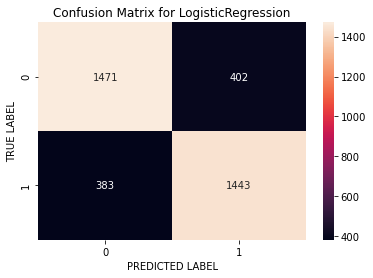

In [77]:
cm = confusion_matrix(y_test,predLR)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]
sns.heatmap(cm, annot = True, fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for LogisticRegression')
plt.show()

# Random Forest Classifier


In [78]:
RFC = RandomForestClassifier()
RFC.fit(x_train,y_train)
predRFC = RFC.predict(x_test)
print(accuracy_score(y_test,predRFC))
print(confusion_matrix(y_test,predRFC))
print(classification_report(y_test,predRFC))

0.9391727493917275
[[1749  124]
 [ 101 1725]]
              precision    recall  f1-score   support

           0       0.95      0.93      0.94      1873
           1       0.93      0.94      0.94      1826

    accuracy                           0.94      3699
   macro avg       0.94      0.94      0.94      3699
weighted avg       0.94      0.94      0.94      3699



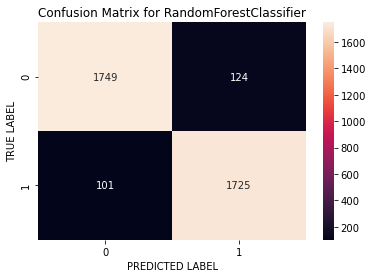

In [79]:
cm = confusion_matrix(y_test,predRFC)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]
sns.heatmap(cm, annot = True, fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for RandomForestClassifier')
plt.show()

# Decision Tree Classifier


In [80]:
DTC = DecisionTreeClassifier()
DTC.fit(x_train,y_train)
predDTC = DTC.predict(x_test)
print(accuracy_score(y_test,predDTC))
print(confusion_matrix(y_test,predDTC))
print(classification_report(y_test,predDTC))

0.8745606920789403
[[1635  238]
 [ 226 1600]]
              precision    recall  f1-score   support

           0       0.88      0.87      0.88      1873
           1       0.87      0.88      0.87      1826

    accuracy                           0.87      3699
   macro avg       0.87      0.87      0.87      3699
weighted avg       0.87      0.87      0.87      3699



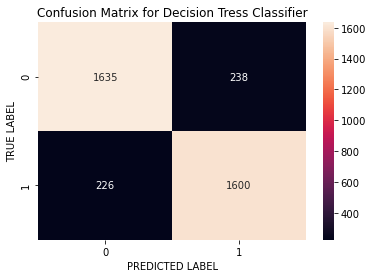

In [81]:
cm = confusion_matrix(y_test,predDTC)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]
sns.heatmap(cm, annot = True, fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Decision Tress Classifier')
plt.show()

# Gradient Boosting Classifier

In [82]:
GB = GradientBoostingClassifier()
GB.fit(x_train,y_train)
predGB = GB.predict(x_test)
print(accuracy_score(y_test,predGB))
print(confusion_matrix(y_test,predGB))
print(classification_report(y_test,predGB))

0.8726682887266829
[[1647  226]
 [ 245 1581]]
              precision    recall  f1-score   support

           0       0.87      0.88      0.87      1873
           1       0.87      0.87      0.87      1826

    accuracy                           0.87      3699
   macro avg       0.87      0.87      0.87      3699
weighted avg       0.87      0.87      0.87      3699



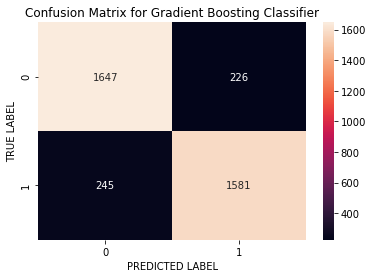

In [83]:
cm = confusion_matrix(y_test,predGB)
x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]
sns.heatmap(cm, annot = True, fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Gradient Boosting Classifier')
plt.show()

# AdaBoost Classifier

In [84]:
ABC = AdaBoostClassifier()
ABC.fit(x_train,y_train)
predABC = ABC.predict(x_test)
print(accuracy_score(y_test,predABC))
print(confusion_matrix(y_test,predABC))
print(classification_report(y_test,predABC))

0.8256285482562855
[[1557  316]
 [ 329 1497]]
              precision    recall  f1-score   support

           0       0.83      0.83      0.83      1873
           1       0.83      0.82      0.82      1826

    accuracy                           0.83      3699
   macro avg       0.83      0.83      0.83      3699
weighted avg       0.83      0.83      0.83      3699



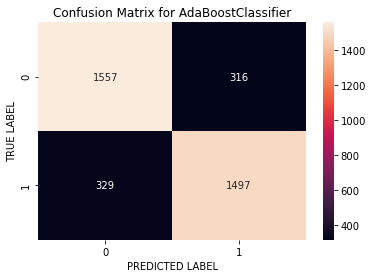

In [85]:
cm = confusion_matrix(y_test,predABC)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]
sns.heatmap(cm, annot = True, fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for AdaBoostClassifier')
plt.show()

# Bagging Classifier

In [86]:
BC = BaggingClassifier()
BC.fit(x_train,y_train)
predBC = BC.predict(x_test)
print(accuracy_score(y_test,predBC))
print(confusion_matrix(y_test,predBC))
print(classification_report(y_test,predBC))

0.9097053257637199
[[1732  141]
 [ 193 1633]]
              precision    recall  f1-score   support

           0       0.90      0.92      0.91      1873
           1       0.92      0.89      0.91      1826

    accuracy                           0.91      3699
   macro avg       0.91      0.91      0.91      3699
weighted avg       0.91      0.91      0.91      3699



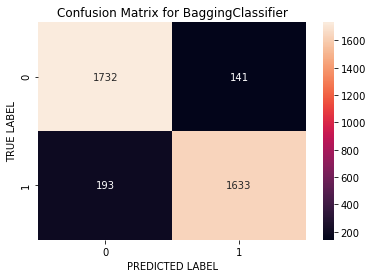

In [87]:
cm = confusion_matrix(y_test,predBC)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]
sns.heatmap(cm, annot = True, fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for BaggingClassifier')
plt.show()

# ExtraTrees Classifier

In [88]:
ET = ExtraTreesClassifier()
ET.fit(x_train,y_train)
predET = ET.predict(x_test)
print(accuracy_score(y_test,predET))
print(confusion_matrix(y_test,predET))
print(classification_report(y_test,predET))

0.9464720194647201
[[1756  117]
 [  81 1745]]
              precision    recall  f1-score   support

           0       0.96      0.94      0.95      1873
           1       0.94      0.96      0.95      1826

    accuracy                           0.95      3699
   macro avg       0.95      0.95      0.95      3699
weighted avg       0.95      0.95      0.95      3699



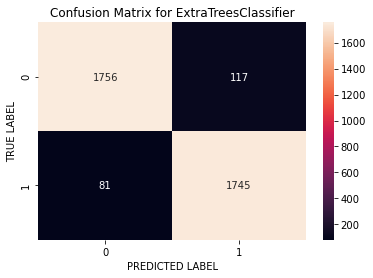

In [89]:
cm = confusion_matrix(y_test,predET)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]
sns.heatmap(cm, annot = True, fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for ExtraTreesClassifier')
plt.show()

# XGB Classifier

In [90]:
XGB = xgb(verbosity=0)
XGB.fit(x_train,y_train)
predXGB = XGB.predict(x_test)
print(accuracy_score(y_test,predXGB))
print(confusion_matrix(y_test,predXGB))
print(classification_report(y_test,predXGB))

0.9391727493917275
[[1773  100]
 [ 125 1701]]
              precision    recall  f1-score   support

           0       0.93      0.95      0.94      1873
           1       0.94      0.93      0.94      1826

    accuracy                           0.94      3699
   macro avg       0.94      0.94      0.94      3699
weighted avg       0.94      0.94      0.94      3699



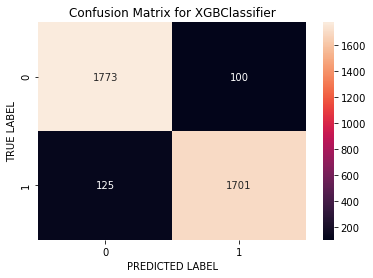

In [91]:
cm = confusion_matrix(y_test,predXGB)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]
sns.heatmap(cm, annot = True, fmt = ".0f",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for XGBClassifier')
plt.show()

# Checking Cross Validation Score

In [92]:
from sklearn.model_selection import cross_val_score

In [93]:
print("Cross_Validation_Score using Logistic Regresion:",cross_val_score(LR,x,y,cv=5).mean())

Cross_Validation_Score using Logistic Regresion: 0.7173560421735604


In [94]:
print("Cross_Validation_Score using Random Forest Classifier:",cross_val_score(RFC,x,y,cv=5).mean())

Cross_Validation_Score using Random Forest Classifier: 0.7934306569343066


In [95]:
print("Cross_Validation_Score using Decision Tree Classifier:",cross_val_score(DTC,x,y,cv=5).mean())

Cross_Validation_Score using Decision Tree Classifier: 0.7390105433901054


In [96]:
print("Cross_Validation_Score using GradientBoosting Classifier:",cross_val_score(GB,x,y,cv=5).mean())

Cross_Validation_Score using GradientBoosting Classifier: 0.6634225466342254


In [97]:
print("Cross_Validation_Score using ADA Boosting Classifier:",cross_val_score(ABC,x,y,cv=5).mean())

Cross_Validation_Score using ADA Boosting Classifier: 0.6715328467153285


In [98]:
print("Cross_Validation_Score using Bagging Classifier:",cross_val_score(BC,x,y,cv=5).mean())

Cross_Validation_Score using Bagging Classifier: 0.7872668288726683


In [99]:
print("Cross_Validation_Score using ExtraTress Classifier:",cross_val_score(ET,x,y,cv=5).mean())

Cross_Validation_Score using ExtraTress Classifier: 0.8039740470397405


In [100]:
print("Cross_Validation_Score using XG Boost Classifier:",cross_val_score(XGB,x,y,cv=5).mean())

Cross_Validation_Score using XG Boost Classifier: 0.6925385239253853


### Best Model - Extra Trees Classifier

# Hyper Parameter Tuning

In [101]:
from sklearn.model_selection import GridSearchCV

In [102]:
parameters = {'criterion':["gini","entropy"],
              'random_state' : [10, 50, 1000],
              'max_depth' : [0, 10, 20],
              'n_jobs' : [-2, -1, 1],
              'n_estimators' : [50,100, 200, 300]}

In [103]:
GCV=GridSearchCV(ExtraTreesClassifier(),parameters,cv=5)

In [104]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [0, 10, 20],
                         'n_estimators': [50, 100, 200, 300],
                         'n_jobs': [-2, -1, 1],
                         'random_state': [10, 50, 1000]})

In [105]:
GCV.best_params_

{'criterion': 'gini',
 'max_depth': 20,
 'n_estimators': 300,
 'n_jobs': -2,
 'random_state': 1000}

In [106]:
rainfall_tomorrow = ExtraTreesClassifier(criterion = 'entropy', max_depth = 20, n_estimators = 300, n_jobs = -2, random_state=1000)
rainfall_tomorrow.fit(x_train, y_train)
pred = rainfall_tomorrow.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

94.24168694241686


#### We get an Accuracy of 94.24% after Hyperparameter Tuning

# Plotting ROC and compare AUC for all the models used

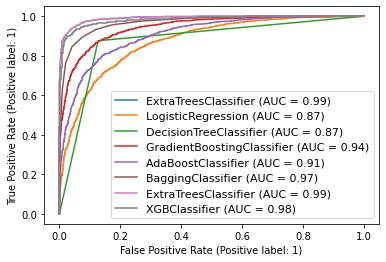

In [107]:
from sklearn import datasets 
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve 

disp = plot_roc_curve(ET,x_test,y_test)
plot_roc_curve(LR, x_test, y_test, ax=disp.ax_) # ax_=Axes with confusion matrix
plot_roc_curve(DTC, x_test, y_test, ax=disp.ax_)
plot_roc_curve(GB, x_test, y_test, ax=disp.ax_)
plot_roc_curve(ABC, x_test, y_test, ax=disp.ax_)
plot_roc_curve(BC, x_test, y_test, ax=disp.ax_)
plot_roc_curve(ET, x_test, y_test, ax=disp.ax_)
plot_roc_curve(XGB, x_test, y_test, ax=disp.ax_)

plt.legend(prop={'size':11}, loc='lower right')
plt.show()

# ROC for Best Model

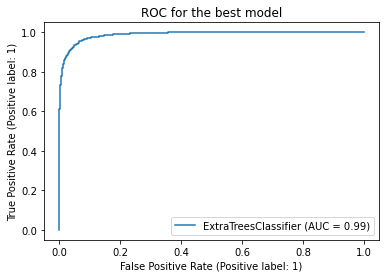

In [108]:
plot_roc_curve(rainfall_tomorrow, x_test, y_test)
plt.title("ROC for the best model")
plt.show()

# Saving the Model

In [109]:
import pickle
filename = 'rainfall_tomorrow_pred.pkl'
pickle.dump(RFC, open(filename, 'wb'))

# Prediction

In [110]:
predict_df = pd.DataFrame([RFC.predict(x_test)[:],y_test[:]],index=["Predicted","Original"])
predict_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

# 2. Predicting how much rainfall could be there

In [111]:
x_df = new_df.drop('Rainfall',axis=1)
y_df = new_df['Rainfall']

In [112]:
x_df.shape, y_df.shape

((7987, 24), (7987,))

# Checking Skewness

In [113]:
x_df.skew()

Location        -0.040284
MinTemp         -0.084549
MaxTemp          0.314510
Evaporation     -0.410953
Sunshine         0.778560
WindGustDir      0.112339
WindGustSpeed    0.506897
WindDir9am       0.160081
WindDir3pm      -0.126255
WindSpeed9am    -0.517704
WindSpeed3pm     0.300109
Humidity9am     -0.231656
Humidity3pm      0.125150
Pressure9am      0.020735
Pressure3pm      0.044876
Cloud9am        -0.356892
Cloud3pm        -0.266829
Temp9am         -0.038035
Temp3pm          0.334170
RainToday        1.301170
RainTomorrow     1.296077
Day              0.002731
Month            0.054460
Year             0.430100
dtype: float64

In [114]:
skew = ['Sunshine','WindSpeed9am','RainToday','RainTomorrow']

In [115]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
x_df[skew] = scaler.fit_transform(x_df[skew].values)
x_df.head()

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,1,13.4,22.9,2.321507,-0.095989,13,44.0,13,14,0.763451,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,-0.542476,-0.543635,1,12,2008
1,1,7.4,25.1,2.321507,-0.095989,14,44.0,6,15,-0.919315,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,-0.542476,-0.543635,2,12,2008
2,1,12.9,25.7,2.321507,-0.095989,15,46.0,13,15,0.679463,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,-0.542476,-0.543635,3,12,2008
3,1,9.2,28.0,2.321507,-0.095989,4,24.0,9,0,-0.064492,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,-0.542476,-0.543635,4,12,2008
4,1,17.5,32.3,2.321507,-0.095989,13,41.0,1,7,-0.513051,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,-0.542476,-0.543635,5,12,2008


# Outliers

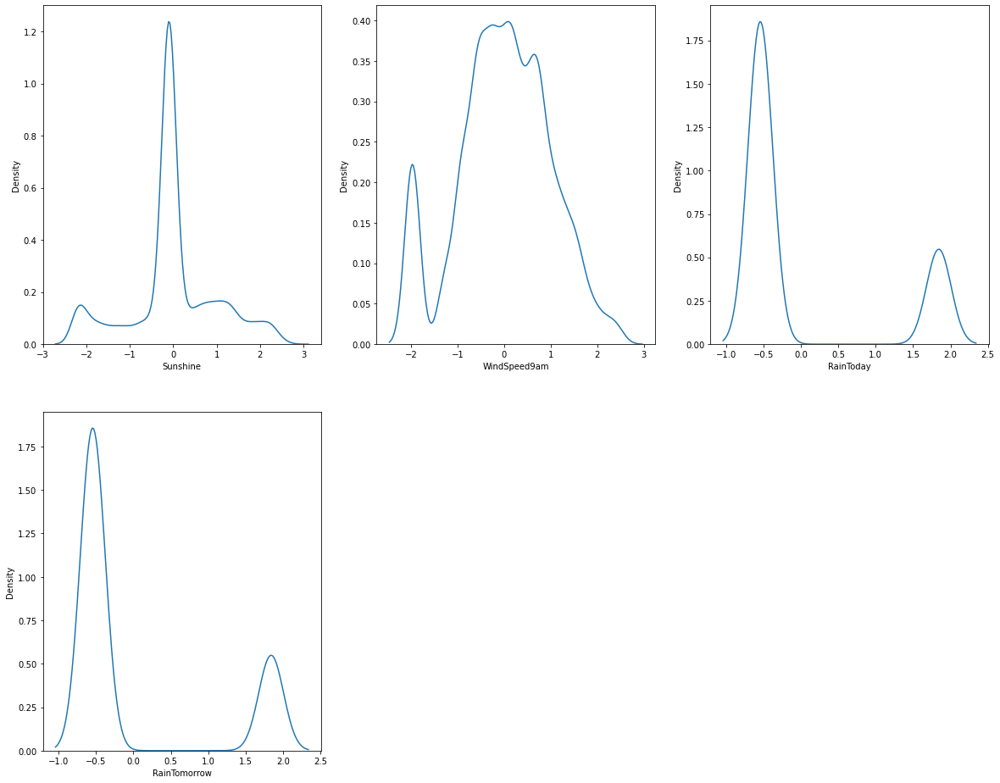

In [116]:
plt.figure(figsize=(20,25))
plotnumber = 1

for i in x_df[skew]:
    if plotnumber<=9:
        ax = plt.subplot(3,3,plotnumber)
        sns.distplot(x_df[i],hist=False)
    plotnumber+=1
plt.show()

# Standard Scaler

In [117]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_df = pd.DataFrame(scaler.fit_transform(x_df),columns = x_df.columns)
x_df

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,-1.508427,0.056444,-0.145732,0.22369,-0.095989,1.229267,0.364103,1.250245,1.400214,0.763451,0.638072,0.184123,-1.624174,-1.687142,-1.398115,1.425345,0.013138,-0.138099,-0.098593,-0.542476,-0.543635,-1.671657,1.634113,-1.661315
1,-1.508427,-1.058476,0.220676,0.22369,-0.095989,1.441960,0.364103,-0.277857,1.626597,-0.919315,0.421555,-1.455097,-1.457752,-1.202435,-1.279988,0.011773,0.013138,-0.084254,0.329747,-0.542476,-0.543635,-1.557976,1.634113,-1.661315
2,-1.508427,-0.036466,0.320605,0.22369,-0.095989,1.654654,0.520531,1.250245,1.626597,0.679463,0.854590,-1.819368,-1.180382,-1.703856,-1.128109,0.011773,-1.076661,0.597788,0.141277,-0.542476,-0.543635,-1.444296,1.634113,-1.661315
3,-1.508427,-0.724000,0.703668,0.22369,-0.095989,-0.684977,-1.200173,0.377044,-1.769138,-0.064492,-0.985811,-1.394385,-1.957019,-0.032451,-0.436219,0.011773,0.013138,0.077282,0.706687,-0.542476,-0.543635,-1.330616,1.634113,-1.661315
4,-1.508427,0.818306,1.419829,0.22369,-0.095989,1.229267,0.129462,-1.369358,-0.184462,-0.513051,0.205037,0.851954,-1.013959,-1.169007,-1.583744,1.013630,1.535531,0.023437,1.254963,-0.542476,-0.543635,-1.216936,1.634113,-1.661315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7982,1.029423,-1.913248,-0.062457,0.22369,-0.095989,-1.535751,-0.652677,0.377044,-1.542755,0.136271,-0.769293,-1.030114,-1.513226,1.137532,0.829435,0.011773,0.013138,-1.358595,0.004208,-0.542476,-0.543635,0.601949,-0.123726,2.004134
7983,1.029423,-1.764592,0.253986,0.22369,-0.095989,-0.259589,-1.356601,0.377044,-1.089991,0.136271,-0.985811,-0.726555,-1.679648,0.953678,0.626930,0.011773,0.013138,-1.215007,0.364014,-0.542476,-0.543635,0.715629,-0.123726,2.004134
7984,1.029423,-1.430116,0.520464,0.22369,-0.095989,-0.897670,-0.183394,0.377044,1.400214,-0.279361,-0.985811,-0.908690,-1.513226,0.535827,0.238796,0.011773,0.013138,-0.927832,0.638152,-0.542476,-0.543635,0.829310,-0.123726,2.004134
7985,1.029423,-0.984148,0.537119,0.22369,-0.095989,0.378492,-0.887318,0.595344,-1.089991,0.136271,-1.202329,-1.030114,-1.513226,0.268402,0.188170,-0.633229,-1.076661,-0.461172,0.621019,-0.542476,-0.543635,0.942990,-0.123726,2.004134


# Model Building

In [120]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

### Best Random State

In [155]:
from sklearn.ensemble import RandomForestRegressor
maxAccu=0
maxRS=0
for i in range(1,200):
    x_df_train,x_df_test,y_df_train,y_df_test = train_test_split(x_df,y_df,test_size=0.30,random_state=i)
    mod = RandomForestRegressor()
    mod.fit(x_df_train,y_df_train)
    pred = mod.predict(x_df_test)
    acc = r2_score(y_df_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Maximum r2 score is ",maxAccu,"at Random_state",maxRS)

Maximum r2 score is  0.8883368096497378 at Random_state 195


In [156]:
x_df_train,x_df_test,y_df_train,y_df_test = train_test_split(x_df,y_df,test_size=.30,random_state=maxRS)

In [134]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor

# Linear Regression

In [135]:
lr = LinearRegression()
dtr.fit(x_df_train,y_df_train)
predDTR = dtr.predict(x_df_test)
print("R2_Score Decision Tree Regressor:",r2_score(y_df_test,predDTR))

R2_Score Decision Tree Regressor: 0.7715204299198137


# Decision Tree Regressor

In [128]:
dtr = DecisionTreeRegressor()
dtr.fit(x_df_train,y_df_train)
predDTR = dtr.predict(x_df_test)
print("R2_Score Decision Tree Regressor:",r2_score(y_df_test,predDTR))

R2_Score Decision Tree Regressor: 0.7815090180309021


# Random Forest Regressor

In [129]:
rfr = RandomForestRegressor()
rfr.fit(x_df_train,y_df_train)
predRFR = rfr.predict(x_df_test)
print("R2_Score:",r2_score(y_df_test,predRFR))

R2_Score: 0.8873803974058637


# KNN Regressor

In [130]:
knn = KNeighborsRegressor()
knn.fit(x_df_train,y_df_train)
predknn = knn.predict(x_df_test)
print("R2_Score using KNN Regressor:",r2_score(y_df_test,predknn))

R2_Score using KNN Regressor: 0.7929863347135335


# Gradient Boosting Regressor

In [131]:
gbr = GradientBoostingRegressor()
gbr.fit(x_df_train,y_df_train)
predGBR = gbr.predict(x_df_test)
print("R2_Score using Gradient Boosting Regressor:",r2_score(y_df_test,predGBR))

R2_Score using Gradient Boosting Regressor: 0.8564432267625004


# AdaBoosting Regressor

In [143]:
abr = AdaBoostRegressor()
abr.fit(x_df_train,y_df_train)
predABR = abc.predict(x_df_test)
print("R2_Score using Gradient Boosting Regressor:",r2_score(y_df_test,predABR))

R2_Score using Gradient Boosting Regressor: 0.8228510334082246


# Cross Validation Score

In [136]:
from sklearn.model_selection import cross_val_score

In [138]:
print("Cross_Validation_Score using Linear Regression:",cross_val_score(lr,x_df,y_df,cv=5).mean())

Cross_Validation_Score using Linear Regression: 0.8261716519905768


In [139]:
print("Cross_Validation_Score using Decision Tree Regression:",cross_val_score(dtr,x_df,y_df,cv=5).mean())

Cross_Validation_Score using Decision Tree Regression: 0.7377822867262495


In [140]:
print("Cross_Validation_Score using Random Forest Regression:",cross_val_score(rfr,x_df,y_df,cv=5).mean())

Cross_Validation_Score using Random Forest Regression: 0.856966790686107


In [141]:
print("Cross_Validation_Score using KNN Regressor:",cross_val_score(knn,x_df,y_df,cv=5).mean())

Cross_Validation_Score using KNN Regressor: 0.763071039092578


In [142]:
print("Cross_Validation_Score using Gradient Boosting Regression:",cross_val_score(gbr,x_df,y_df,cv=5).mean())

Cross_Validation_Score using Gradient Boosting Regression: 0.8337884240208624


In [144]:
print("Cross_Validation_Score using AdaBoost Regression:",cross_val_score(abr,x_df,y_df,cv=5).mean())

Cross_Validation_Score using AdaBoost Regression: 0.7981745000149351


### Best Model - Random Forest Regression

# Hyperparameter Tuning

In [146]:
from sklearn.model_selection import GridSearchCV

In [147]:
parameters = {'criterion':['mse', 'mae'],
             'max_features':['auto', 'sqrt', 'log2'],
             'n_estimators':[0,200],
             'max_depth':[2,3,4,6]}

In [148]:
GCV=GridSearchCV(RandomForestRegressor(),parameters,cv=5)

In [149]:
GCV.fit(x_df_train,y_df_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'criterion': ['mse', 'mae'], 'max_depth': [2, 3, 4, 6],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'n_estimators': [0, 200]})

In [150]:
GCV.best_params_

{'criterion': 'mse',
 'max_depth': 6,
 'max_features': 'auto',
 'n_estimators': 200}

In [158]:
rainfall = RandomForestRegressor(criterion='mse', max_depth=6, max_features='auto', n_estimators=200)
rainfall.fit(x_df_train, y_df_train)
pred = rainfall.predict(x_df_test)
print('R2_Score:',r2_score(y_df_test,pred)*100)

R2_Score: 85.66800178763324


#### We get an Accuracy Score of 85.66% after Hyperparameter Tuning

# Saving the Model

In [159]:
import pickle
filename = 'rainfall_model.pkl' 
pickle.dump(rfr, open(filename, 'wb'))

# Prediction of Rainfall

In [161]:
a = np.array(y_df_test)
predicted = np.array(rfr.predict(x_df_test))
df_pred= pd.DataFrame({"Original":a, "Predicted":predicted}, index=range(len(a)))
df_pred

,Original,Predicted
0,0.000000,0.014736
1,0.000000,0.092832
2,2.732394,1.402718
3,0.000000,0.085215
4,0.000000,0.266470
...,...,...
2392,1.169607,1.309413
2393,0.000000,0.026432
2394,0.584804,0.528185
2395,0.000000,0.228502
